# Zomato Restaurant Analysis and Recommendation System

#### 📍 BANGALORE, INDIA


![zomato](https://cdn.businesstraveller.com/wp-content/uploads/fly-images/951047/zomato-infinity-dining-916x516.jpg)

## 1. Installing dependencies

In [2]:
import numpy as np
import pandas as pd
import os
import re
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import plotly.offline as py
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode
import missingno as msno
from wordcloud import WordCloud
from geopy.geocoders import Nominatim
from folium.plugins import HeatMap
import folium
from tqdm import tqdm
import gensim
from collections import Counter
import matplotlib.colors as mcolors
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.manifold import TSNE
from gensim.models import word2vec
import nltk

## kernel setting
warnings.filterwarnings('ignore')
plt.style.use('ggplot')
sns.set_style('darkgrid')
init_notebook_mode(connected=False)
%matplotlib inline

## Loading the dataset

In [3]:
dataset = pd.read_csv('/kaggle/input/zomato-bangalore-restaurants/zomato.csv')
df = dataset.copy()
print("\nLoading the dataset.")
df.head()


Loading the dataset.


,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


### Basic idea of dataset


Dataset info: 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51717 entries, 0 to 51716
Data columns (total 17 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   url                          51717 non-null  object
 1   address                      51717 non-null  object
 2   name                         51717 non-null  object
 3   online_order                 51717 non-null  object
 4   book_table                   51717 non-null  object
 5   rate                         43942 non-null  object
 6   votes                        51717 non-null  int64 
 7   phone                        50509 non-null  object
 8   location                     51696 non-null  object
 9   rest_type                    51490 non-null  object
 10  dish_liked                   23639 non-null  object
 11  cuisines                     51672 non-null  object
 12  approx_cost(for two people)  51371 non-null  object
 13  reviews_list   

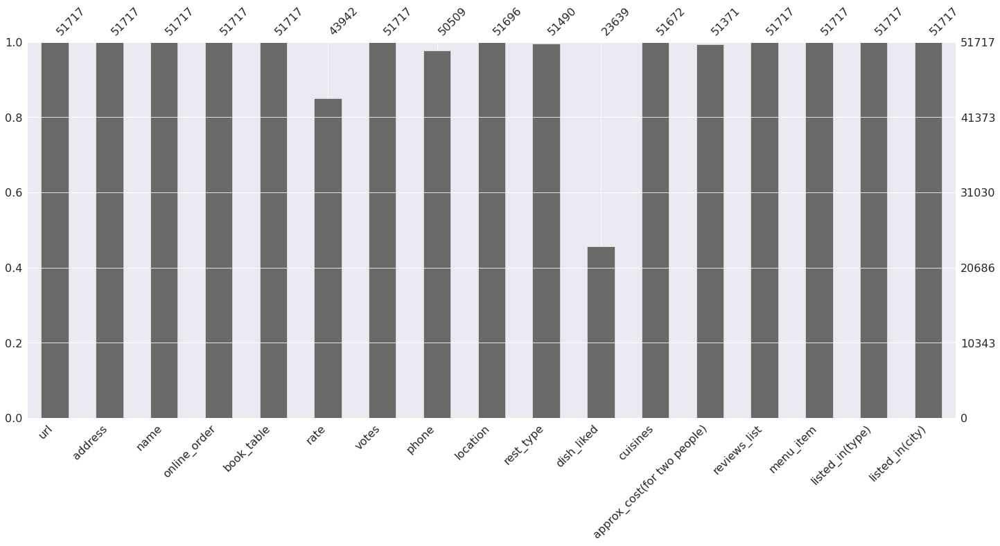

In [4]:
def dataset_info(df):
    print("\nDataset info: ")
    print(df.info())
    print("-"*40)
    print("\nDataset Column Names specifically: ")
    print(df.columns)
    print("-"*40)
    print("\nMissing values: ")
    print(df.isnull().sum())
    print('-'*40)
    print("\n")
    msno.bar(df)
    plt.show()

    
dataset_info(df)

- The above output cell showed us some important insights related to dataframe.

- There are missing values in some columns/variables. 

### Column Description

- **url** conains the url of restaurant in the zomato website
- **address** contains the address of the restaurant in Bengaluru
- **name** contains the name of re
- **online_order** whether online ordering is available in the restaurant or not
- **book_table** table book option available or not
- **rate** contains the overall rating of the restaurant out of 5
- **votes** contains total number of rating for the restaurant as of the above mentioned date
- **phone** contains the phone number of the restaurant
- **location** contains the neighborhood in which the restaurant is located
- **rest_type** restaurant type
- **dish_liked** dishes people liked in the restaurant
- **cuisines** food styles, separated by comma
- **approx_cost(for two people)** contains the approximate cost for meal for two people
- **reviews_list** list of tuples containing reviews for the restaurant, each tuple
- **menu_item** contains list of menus available in the restaurant
- **listed_in(type)** type of meal
- **listed_in(city)** contains the neighborhood in which the restaurant is listed

## 2. Feature Engineering

### EDA - Exploratory Data Analysis

**Is EDA done before or after data cleaning?**

Exploratory Data Analysis (EDA) is the very first step before you can perform any changes to the dataset or develop a statistical model to answer business problems. In other words, the process of EDA contains summarizing, visualizing and getting deeply acquainted with the important traits of a data set.

- **Note**:
Before moving forward in EDA we will fix some columns names, drop duplicates, and casting variables.

In [5]:
df.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


In [6]:
## checking sum of duplicates
df.duplicated().sum()

0

In [7]:
## dropping duplicate values
df.drop_duplicates(inplace=True)

- We'll see the % of the missing values in the dataframe so that and will decide to replace with them with mean/median/mode or simply drop them.

In [8]:
print(round((df.isnull().sum()*100/len(df)),2).sort_values(ascending=False))

dish_liked                     54.29
rate                           15.03
phone                           2.34
approx_cost(for two people)     0.67
rest_type                       0.44
cuisines                        0.09
location                        0.04
listed_in(type)                 0.00
menu_item                       0.00
reviews_list                    0.00
url                             0.00
address                         0.00
votes                           0.00
book_table                      0.00
online_order                    0.00
name                            0.00
listed_in(city)                 0.00
dtype: float64


- We can simply drop the null values as the % of missing values are very less.

In [9]:
# dropping the null value
df.dropna(how='any',inplace=True)

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23193 entries, 0 to 51715
Data columns (total 17 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   url                          23193 non-null  object
 1   address                      23193 non-null  object
 2   name                         23193 non-null  object
 3   online_order                 23193 non-null  object
 4   book_table                   23193 non-null  object
 5   rate                         23193 non-null  object
 6   votes                        23193 non-null  int64 
 7   phone                        23193 non-null  object
 8   location                     23193 non-null  object
 9   rest_type                    23193 non-null  object
 10  dish_liked                   23193 non-null  object
 11  cuisines                     23193 non-null  object
 12  approx_cost(for two people)  23193 non-null  object
 13  reviews_list                 23

In [11]:
# renaming the columns
df = df.rename(columns={'approx_cost(for two people)':'cost','listed_in(type)':'type','listed_in(city)':'city'})

df.columns

Index(['url', 'address', 'name', 'online_order', 'book_table', 'rate', 'votes',
       'phone', 'location', 'rest_type', 'dish_liked', 'cuisines', 'cost',
       'reviews_list', 'menu_item', 'type', 'city'],
      dtype='object')

### 1. Top restaurant in banglore 

In [12]:
df['name'].value_counts(ascending=False)

Onesta               85
Empire Restaurant    69
KFC                  59
McDonald's           57
Pizza Hut            56
                     ..
Agraharam Meal        1
Fresh 'N' Grills      1
Coorg Diaries         1
Lassi Resto Cafe      1
Fujian Express        1
Name: name, Length: 3159, dtype: int64

In [13]:
# top 20 restaurant from Banglore on Zomato
df['name'].value_counts(ascending=False)[:20]

Onesta                    85
Empire Restaurant         69
KFC                       59
McDonald's                57
Pizza Hut                 56
Domino's Pizza            55
Smally's Resto Cafe       54
Faasos                    54
Corner House Ice Cream    52
Burger King               51
Polar Bear                48
Hammered                  47
Smoor                     47
Mani's Dum Biryani        47
Pizza Stop                46
Chung Wah                 45
Mainland China            45
Subway                    45
Lakeview Milkbar          44
Truffles                  43
Name: name, dtype: int64

#### Top 20 restaurants in Banglore by Zomato

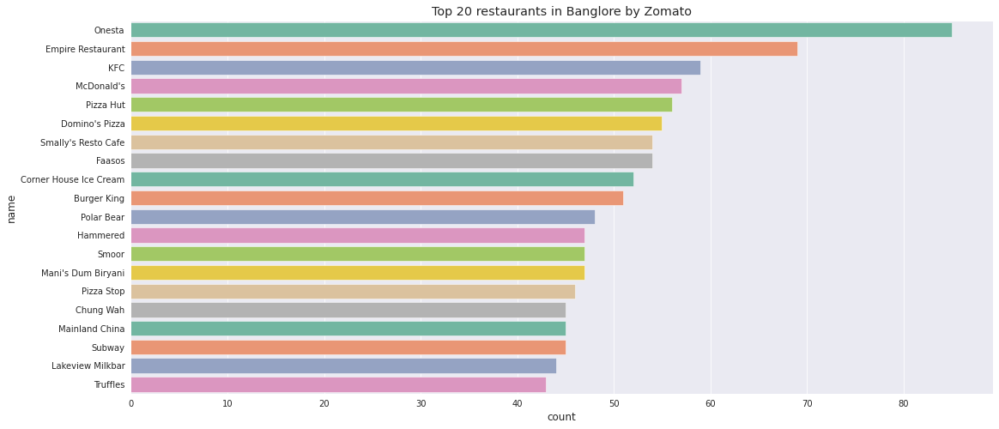

In [14]:
top_20_restaurants = df['name'].value_counts(ascending=False)[:20]

plt.figure(figsize=(18,8))
sns.countplot(y='name', data=df, order=top_20_restaurants.index,palette='Set2')
plt.title("Top 20 restaurants in Banglore by Zomato");

- `Cafe Coffe Day and Onesta` has highest number ordered restaurants in `Banglore, City`.
- Top food chains such as `Baskin Robbins, Pizza Hut, Domino's Piza, KFC, Subway, etc.` are also present.

## How many restaurants accepting online orders?

- As clearly indincated, almost 60 percent of retaurants in Banglore accepts online orders.
- Where 40% of restaurants do not accept online orders.
- This might because of the fact that these restaurants cannot afford to pay commision to Zomato for giving them orders online.

## Ratio between restaurants that provide and do not table booking

In [15]:
print("In normalize form: \n")
df['book_table'].value_counts(normalize=True)

In normalize form: 



No     0.736041
Yes    0.263959
Name: book_table, dtype: float64

- Nearly `90%` of the restaurant in Banglore do not provide table booking facility.
- Although Banglore is one of the major cities in India but sill doesn't provice table booking facilities. One of the reason is that in India table booking facilities are available only in 5-star restaurants.

#### Visualizing the booking table ratio

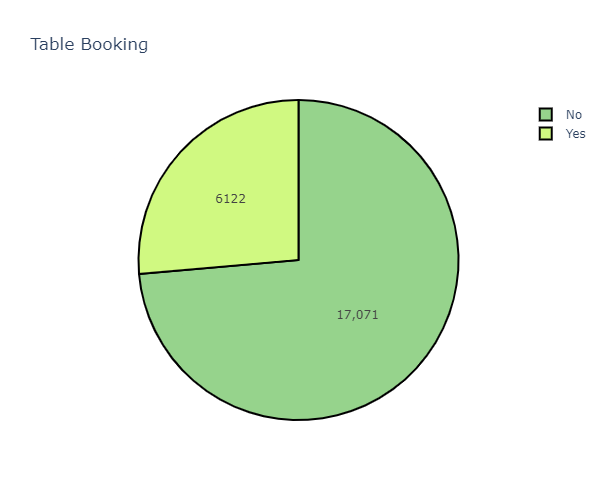

'book_table.html'

In [16]:
import plotly.offline as pyo
pyo.init_notebook_mode()

x = df['book_table'].value_counts()
colors = ['#96D38C', '#D0F981']

trace = go.Pie(labels=x.index, values=x, textinfo="value",
              marker=dict(colors=colors,
                         line=dict(color='#000000',width=2)))
layout = go.Layout(title="Table Booking",width=500, height=500)
fig = go.Figure(data=[trace],layout=layout)
py.iplot(fig, filename='pie_chart_subplots')

pyo.plot(fig, filename='book_table.html')

- In statistical term we can say that ratio tends more towards `No`

## Rating Distribution

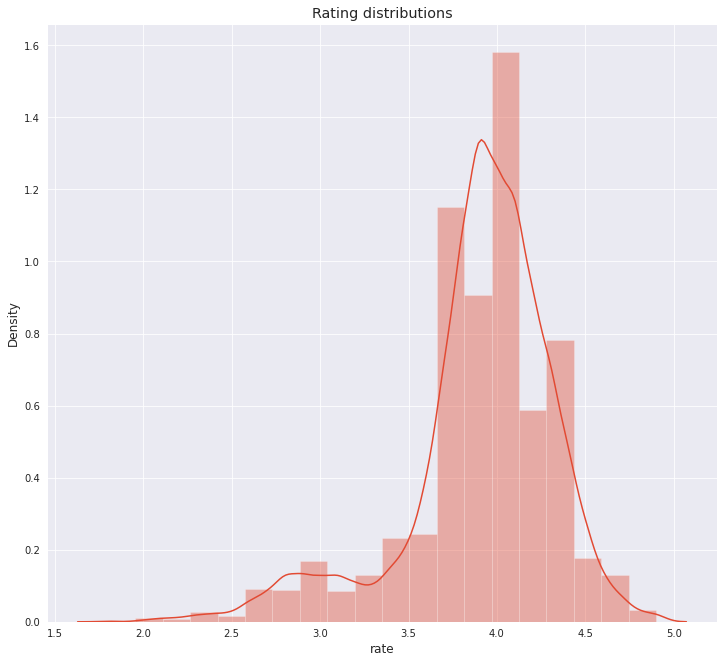

In [17]:
plt.figure(figsize=(12,11))
rating = df['rate'].dropna().apply(lambda x: float(x.split('/')[0]) if (len(x)>3) else np.nan).dropna()
sns.distplot(rating,bins=20)
plt.title('Rating distributions')
plt.show();

- Rating is normally distributed.
- Most of the rating which almost `50%` lies between 3 and 4.

In [18]:
df.columns

Index(['url', 'address', 'name', 'online_order', 'book_table', 'rate', 'votes',
       'phone', 'location', 'rest_type', 'dish_liked', 'cuisines', 'cost',
       'reviews_list', 'menu_item', 'type', 'city'],
      dtype='object')

## Cost vs Rating

In [19]:
cost_dist=df[['rate','cost','online_order']].dropna()
cost_dist['rate']=cost_dist['rate'].apply(lambda x: float(x.split('/')[0]) if len(x)>3 else 0)
cost_dist['cost']=cost_dist['cost'].apply(lambda x: int(x.replace(',','')))

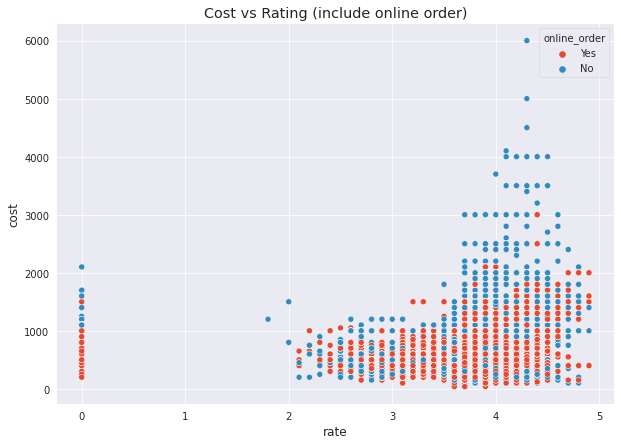

In [20]:
plt.figure(figsize=(10,7))
sns.scatterplot(x='rate', y='cost', hue='online_order',data=cost_dist)
plt.title('Cost vs Rating (include online order)')
plt.show();

- Higher the cost(more than 2500) and rating(more than 3.5) these combination is observed in retaurants which are not supporting online order.
- Most of the restaurants which are supporing online order(Zomato) has cost not more than 2000 and rating ranges from 2.5 to 4.5

## Distribution of cost for two people

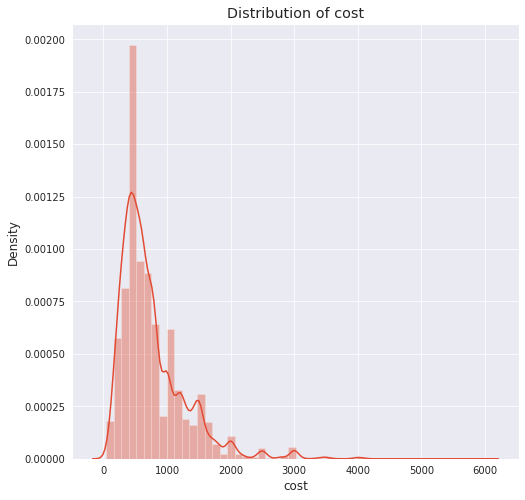

In [21]:
plt.figure(figsize=(8,8))
sns.distplot(cost_dist['cost'])
plt.title('Distribution of cost')
plt.show();

- We can see that the distribution of cost is left skewed.
- This means almost `90%` of the restaurants serve food for budget less that 1000 INR.
- People in a Banglore are rarely spending more than 1000 INR on restaurant foods.

## Is there any difference between votes of restaurants accepting and not accepting online orders?

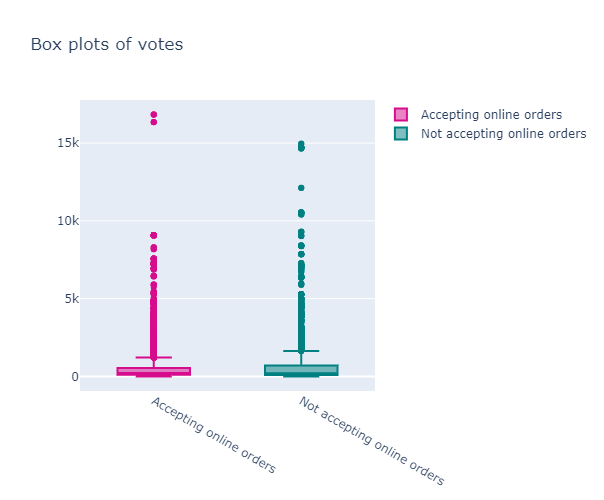

In [22]:
votes_yes=df[df['online_order']=='Yes']['votes']
trace0=go.Box(y=votes_yes,name='Accepting online orders',
            marker= dict(
            color='rgb(214,12,140)'))
votes_no = df[df['online_order']=='No']['votes']
trace1 = go.Box(y=votes_no, name='Not accepting online orders',
               marker=dict(
               color='rgb(0,128,128)'))
layout = go.Layout(title='Box plots of votes',width=800,height=500)

data = [trace0, trace1]
fig = go.Figure(data=data,layout=layout)
py.iplot(fig)

- Yes you can observe that median number of votes for both categories vary.
- Restaurants accepting online orders tend to get more votes from customers as there is a rating option poping up after each order through zomato application.

## Top 20 restaurant types in a Banglore

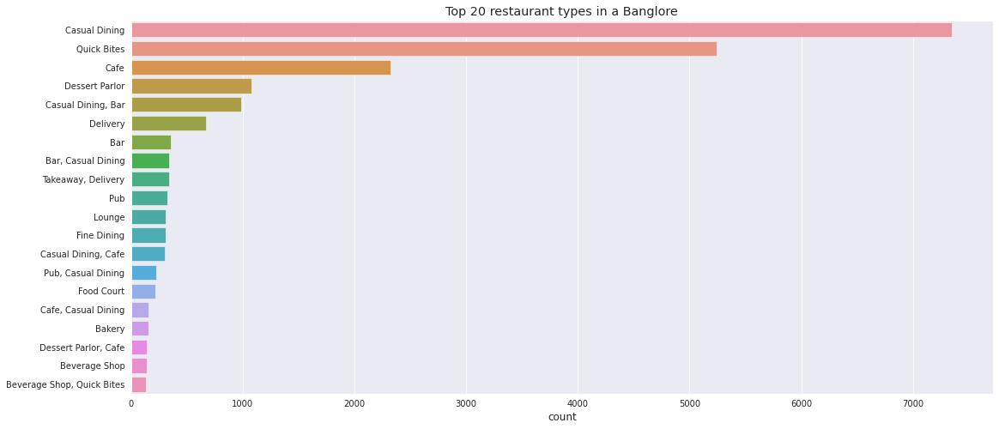

In [23]:
plt.figure(figsize=(18,8))
rest = df['rest_type'].value_counts()[:20]
sns.barplot(rest,rest.index)
plt.title("Top 20 restaurant types in a Banglore")
plt.xlabel("count")
plt.show();

- No doubt about this as Banglore is known as the tech capital of India, people having busy and modern life will prefer Quick Bites.
- We can observe the Quick Bites type restaurants dominates.

## Cost Factor

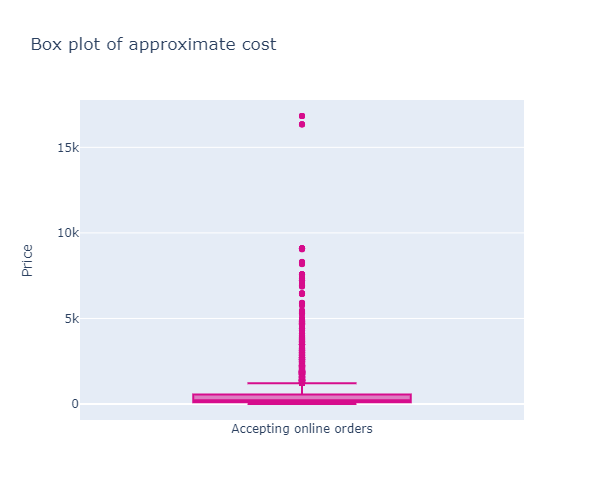

In [24]:
trace = go.Box(y=df['cost'],name='Accepting online orders',
              marker=dict(
              color='rgb(214, 12, 140)'))
data = [trace0]
layout = go.Layout(title="Box plot of approximate cost", width=800,height=500,yaxis=dict(title="Price"))
fig=go.Figure(data=data, layout=layout)
py.iplot(fig)

- The median approximate cost of two people is 400 for a single meal.
- `50%` of restaurants charge between 300 and 650 for single meal for two people.

## What are some foodies areas in Banglore?

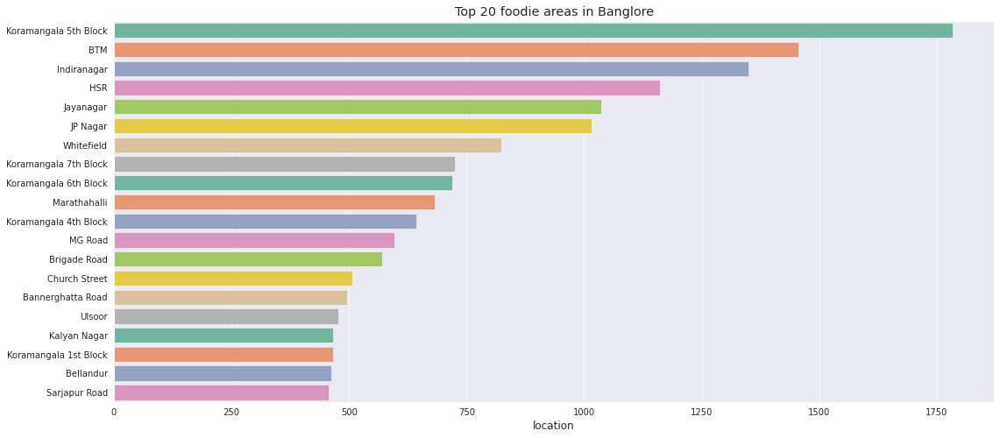

In [25]:
plt.figure(figsize=(18,8))
rest_locations = df['location'].value_counts()[:20]
sns.barplot(rest_locations, rest_locations.index, palette='Set2')
plt.title("Top 20 foodie areas in Banglore")
plt.show();

In [26]:
df['location'].value_counts(ascending=False)[:20]

Koramangala 5th Block    1783
BTM                      1456
Indiranagar              1350
HSR                      1162
Jayanagar                1037
JP Nagar                 1016
Whitefield                824
Koramangala 7th Block     725
Koramangala 6th Block     720
Marathahalli              683
Koramangala 4th Block     644
MG Road                   596
Brigade Road              570
Church Street             508
Bannerghatta Road         496
Ulsoor                    477
Kalyan Nagar              467
Koramangala 1st Block     466
Bellandur                 462
Sarjapur Road             456
Name: location, dtype: int64

- BTM Layout (an abbreviation of Byrasandra, Tavarekere and Madivala Layout) or Kuvempunagara is a locality in Bengaluru, Karnataka, India. By Wikipedia.
- `BTM` is top foodie location in Banglore followed by `Koramangala 5th block` and `HSR`

## Finding best budget Restaurants in any location

- Let's create a function which can find best budget restaurant by passing location name and restaurant types

- Crietria for choosing best restaurant
1. Rating `>=4`
2. Cost `<=500`

In [27]:
cost_dist=df[['rate','cost','location','name','rest_type']].dropna()
cost_dist['rate']=cost_dist['rate'].apply(lambda x: float(x.split('/')[0]) if len(x)>3 else 0)
cost_dist['cost']=cost_dist['cost'].apply(lambda x: int(x.replace(',','')))

In [28]:
def return_budget(location, rest):
    budget = cost_dist[(cost_dist['cost']<=500) & (cost_dist['location']==location) & 
                      (cost_dist['rate']>=4) & (cost_dist['rest_type']==rest)]
    return (budget['name'].unique())

In [29]:
return_budget('BTM', 'Quick Bites')

array(['Hiyar Majhe Kolkata', 'Swadista Aahar', 'Swad Punjab Da',
       'Roti Wala', 'Litti Twist', 'The Shawarma Shop', 'Gorbandh',
       'Yum In My Tum', 'Nanna Munna Paratha House', 'Andhra Kitchen',
       "Muthashy's", 'Ashirvaad Grand', 'Hungry Lee', 'Kannur Food Point',
       "Domino's Pizza", 'Kesar Sweet Shop and Fast Food', 'KFC',
       'The Biriyani Pedia'], dtype=object)

In [30]:
return_budget('HSR', 'Cafe')

array(['Tea Addict'], dtype=object)

## What are the most common cuisines in each locations?

In [31]:
df_1=df.groupby(['location','cuisines']).agg('count')
data_cuisines_loc=df_1.sort_values(['url'],ascending=False).groupby(['location'],
                as_index=False).apply(lambda x : x.sort_values(by="url",ascending=False).head(3))['url'].reset_index().rename(columns={'url':'count'})


In [32]:
data_cuisines_loc.head(10)

,level_0,location,cuisines,count
0,0,BTM,"North Indian, Chinese",87
1,0,BTM,North Indian,86
2,0,BTM,Cafe,42
3,1,Banashankari,"North Indian, Chinese",30
4,1,Banashankari,South Indian,25
5,1,Banashankari,"South Indian, North Indian, Chinese",17
6,2,Banaswadi,"Cafe, Fast Food",10
7,2,Banaswadi,South Indian,9
8,2,Banaswadi,Biryani,7
9,3,Bannerghatta Road,"North Indian, Chinese",58


- STRANGE! Banglore is located in southern part of India where South Indian food is very famous but our data claims that people ordered `North Indian` food more than South India.
- `Chinese` is another popular food in Banglore


## Extracting location information using Geopy

In [33]:
locations=pd.DataFrame({"Name":df['location'].unique()})
locations['Name']=locations['Name'].apply(lambda x: "Bangalore " + str(x))
lat_lon=[]
geolocator=Nominatim(user_agent="app")
for location in locations['Name']:
    location = geolocator.geocode(location)
    if location is None:
        lat_lon.append(np.nan)
    else:    
        geo=(location.latitude,location.longitude)
        lat_lon.append(geo)


locations['geo_loc']=lat_lon
locations.to_csv('locations.csv',index=False)

In [34]:
locations["Name"] = locations['Name'].apply(lambda x: " ".join(filter(lambda y: y!="Bangalore",x.split())))
locations.head()

,Name,geo_loc
0,Banashankari,"(12.965283249999999, 77.59445195)"
1,Basavanagudi,"(12.9417261, 77.5755021)"
2,Jayanagar,"(12.9292731, 77.5824229)"
3,Kumaraswamy Layout,"(12.9081487, 77.5553179)"
4,Rajarajeshwari Nagar,"(12.9274413, 77.5155224)"


## Heatmap of restaurant count on each location

In [35]:
Rest_locations=pd.DataFrame(df['location'].value_counts().reset_index())
Rest_locations.columns=['Name','count']
Rest_locations=Rest_locations.merge(locations,on='Name',how="left").dropna()
Rest_locations['count'].max()

1783

In [36]:
def generateBaseMap(default_location=[12.97, 77.59], default_zoom_start=12):
    base_map = folium.Map(location=default_location, control_scale=True, zoom_start=default_zoom_start)
    return base_map

In [37]:
lat,lon=zip(*np.array(Rest_locations['geo_loc']))
Rest_locations['lat']=lat
Rest_locations['lon']=lon
basemap=generateBaseMap()
HeatMap(Rest_locations[['lat','lon','count']].values.tolist(),zoom=20,radius=15).add_to(basemap)

In [38]:
basemap

- It is clear thar restaurants tend to concentrate in central Bangalore area.
- So,potential restaurant entrepreneurs can refer this and find out good locations for their venture.

## Which are the most popula cuisines of Bangalore?

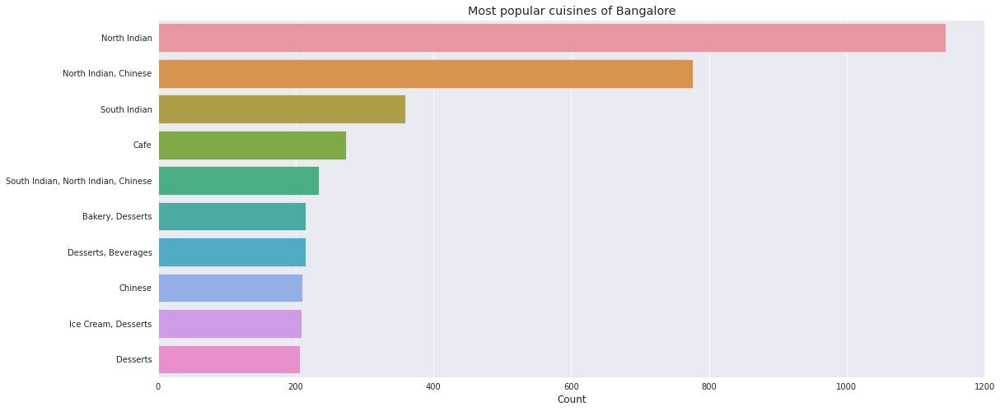

In [39]:
plt.figure(figsize=(18,8))
cuisines=df['cuisines'].value_counts()[:10]
sns.barplot(cuisines,cuisines.index)
plt.xlabel('Count')
plt.title("Most popular cuisines of Bangalore")
plt.show();

- We can observe that `North Indian. Chinese, South Indian and Biryani` are most common.
- Is this implies a fact that Bangalore is more influences by `North Indian` culture more than South?
- We will inspect furhter...

## Hotspot of North Indian restaurants

In [40]:
def produce_data(col,name):
    data= pd.DataFrame(df[df[col]==name].groupby(['location'],as_index=False)['url'].agg('count'))
    data.columns=['Name','count']
    print(data.head())
    data=data.merge(locations,on="Name",how='left').dropna()
    data['lan'],data['lon']=zip(*data['geo_loc'].values)
    return data.drop(['geo_loc'],axis=1)

In [41]:
North_India=produce_data('cuisines','North Indian')

                Name  count
0                BTM     86
1       Banashankari     10
2          Banaswadi      4
3  Bannerghatta Road     36
4       Basavanagudi     12


In [42]:
basemap=generateBaseMap()
HeatMap(North_India[['lan','lon','count']].values.tolist(),zoom=20,radius=15).add_to(basemap)
basemap

- So it is interesting to see cluster of North Indian restaurants in South Banglore Area.
- This may indicate that these areas are more populated by North Indians or migrants who came for a job.

## South Indian restaurants

In [43]:
food = produce_data('cuisines','South Indian')
basemap = generateBaseMap()
HeatMap(food[['lan','lon','count']].values.tolist(),zoom=20,radius=15).add_to(basemap)
basemap

                Name  count
0                BTM      6
1       Banashankari     25
2          Banaswadi      9
3  Bannerghatta Road      3
4       Basavanagudi     44


- They tend to span all over Bangalore
- South Indian cuisines tend to cluster near central Bangalore.

## Analysing Restaurant Chains

In [44]:
def produce_chains(name):
    data_chain = pd.DataFrame(df[df["name"]==name]['locatin'].value_counts().reset_index())
    data_chains.columns = ['Name','Count']
    data_chain=data_chain.merge(locations, on="Name", how="left").dropna()
    data_chain['lan'],data_chain['lon']=zip(*data_chain['geo_loc'].values)
    return data_chain[['Name','Count', 'lan','lon']]

In [45]:
df_1=df.groupby(['rest_type','name']).agg('count')
datas=df_1.sort_values(['url'],ascending=False).groupby(['rest_type'],
                as_index=False).apply(lambda x : x.sort_values(by="url",ascending=False).head(3))['url'].reset_index().rename(columns={'url':'count'})


## Which are most popular casual dining restaurant?

In [46]:
casual=datas[datas['rest_type']=='Casual Dining']
casual

,level_0,rest_type,name,count
49,20,Casual Dining,Empire Restaurant,58
50,20,Casual Dining,Mani's Dum Biryani,47
51,20,Casual Dining,Chung Wah,45


- We can see that `Empire Restaurant, Mani's Dum Biryani, and Chung Wah` are the most popular casual dining restauant chains in Bangalore.


## Analysing Reviews

- In this section we will go no to prepare review dataframe.
- We will extract reviews and ratings of each restaurant and create a dataframe with it.

In [47]:
all_ratings = []
for name, ratings in tqdm(zip(df['name'],df['reviews_list'])):
    ratings = eval(ratings)
    for score, doc in ratings:
        if score:
            score = score.strip("Rated").strip()
            doc = doc.strip('RATED').strip()
            score = float(score)
            all_ratings.append([name, score, doc])

23193it [00:20, 1137.69it/s]


In [52]:
rating_df=pd.DataFrame(all_ratings,columns=['name','rating','review'])
rating_df['review']=rating_df['review'].apply(lambda x : re.sub('[^a-zA-Z0-9\s]',"",x))

In [53]:
rating_df.to_csv('Ratings.csv')

In [54]:
rating_df.head()

,name,rating,review
0,Jalsa,4.0,A beautiful place to dine inThe interiors take...
1,Jalsa,4.0,I was here for dinner with my family on a week...
2,Jalsa,2.0,Its a restaurant near to Banashankari BDA Me a...
3,Jalsa,4.0,We went here on a weekend and one of us had th...
4,Jalsa,5.0,The best thing about the place is its ambiance...


## WordCloud of reviews of restaurants chains

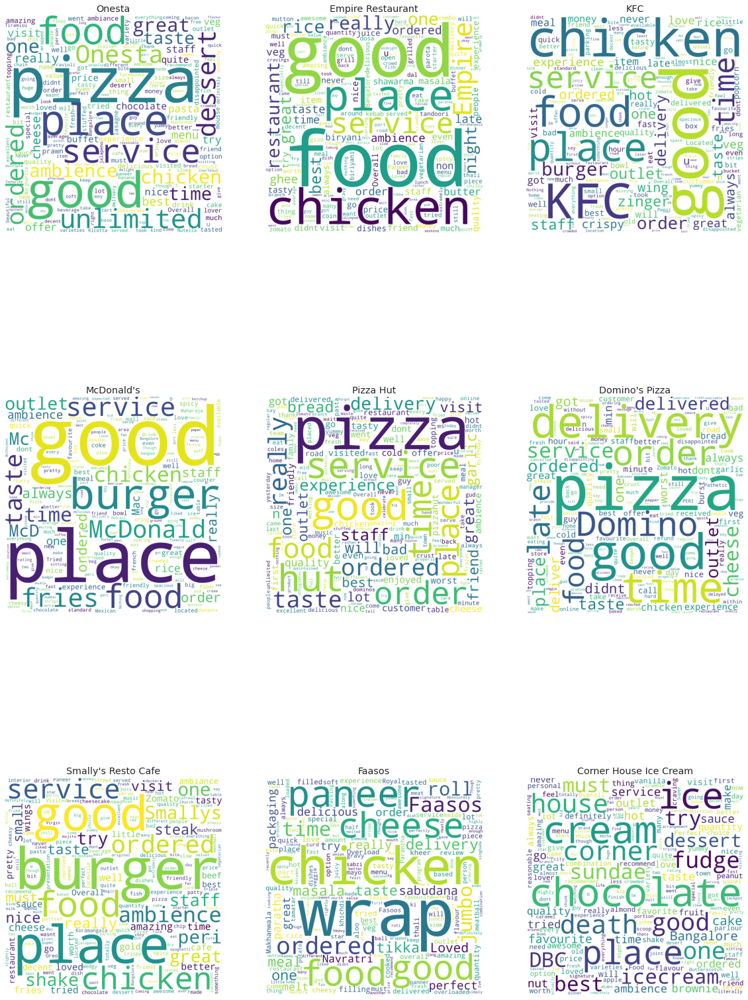

In [56]:
est=df['name'].value_counts()[:9].index
def produce_wordcloud(rest):
    
    plt.figure(figsize=(20,30))
    for i,r in enumerate(rest):
        plt.subplot(3,3,i+1)
        corpus=rating_df[rating_df['name']==r]['review'].values.tolist()
        corpus=' '.join(x  for x in corpus)
        wordcloud = WordCloud(max_font_size=None, background_color='white', collocations=False,
                      width=1500, height=1500).generate(corpus)
        plt.imshow(wordcloud)
        plt.title(r)
        plt.axis("off")
        

        
        
produce_wordcloud(rest)

## Rating distribution

Text(0, 0.5, 'Count')

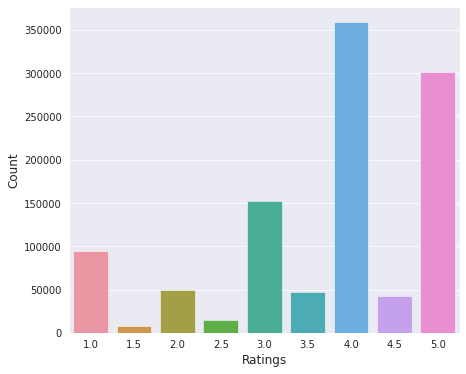

In [58]:
plt.figure(figsize=(7,6))
rating=rating_df['rating'].value_counts()
sns.barplot(x=rating.index, y=rating)
plt.xlabel('Ratings')
plt.ylabel('Count')

# Data Transformation

In [59]:
df.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,cost,reviews_list,menu_item,type,city
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


In [61]:
df['cost'] = df['cost'].astype(str)
df['cost'] = df['cost'].apply(lambda x: x.replace(',','.'))
df['cost'] = df['cost'].astype(float)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23193 entries, 0 to 51715
Data columns (total 17 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   url           23193 non-null  object 
 1   address       23193 non-null  object 
 2   name          23193 non-null  object 
 3   online_order  23193 non-null  object 
 4   book_table    23193 non-null  object 
 5   rate          23193 non-null  object 
 6   votes         23193 non-null  int64  
 7   phone         23193 non-null  object 
 8   location      23193 non-null  object 
 9   rest_type     23193 non-null  object 
 10  dish_liked    23193 non-null  object 
 11  cuisines      23193 non-null  object 
 12  cost          23193 non-null  float64
 13  reviews_list  23193 non-null  object 
 14  menu_item     23193 non-null  object 
 15  type          23193 non-null  object 
 16  city          23193 non-null  object 
dtypes: float64(1), int64(1), object(15)
memory usage: 3.7+ MB


In [62]:
# rate of dataset
df['rate'].unique()

array(['4.1/5', '3.8/5', '3.7/5', '4.6/5', '4.0/5', '4.2/5', '3.9/5',
       '3.0/5', '3.6/5', '2.8/5', '4.4/5', '3.1/5', '4.3/5', '2.6/5',
       '3.3/5', '3.5/5', '3.8 /5', '3.2/5', '4.5/5', '2.5/5', '2.9/5',
       '3.4/5', '2.7/5', '4.7/5', 'NEW', '2.4/5', '2.2/5', '2.3/5',
       '4.8/5', '3.9 /5', '4.2 /5', '4.0 /5', '4.1 /5', '2.9 /5',
       '2.7 /5', '2.5 /5', '2.6 /5', '4.5 /5', '4.3 /5', '3.7 /5',
       '4.4 /5', '4.9/5', '2.1/5', '2.0/5', '1.8/5', '3.4 /5', '3.6 /5',
       '3.3 /5', '4.6 /5', '4.9 /5', '3.2 /5', '3.0 /5', '2.8 /5',
       '3.5 /5', '3.1 /5', '4.8 /5', '2.3 /5', '4.7 /5', '2.4 /5',
       '2.1 /5', '2.2 /5', '2.0 /5', '1.8 /5'], dtype=object)

In [64]:
# remove '/5' from rates
df = df.loc[df.rate!='NEW']
df = df.loc[df.rate!='-'].reset_index(drop=True)
remove_slash = lambda x: x.replace('/5', '') if type(x) == np.str else x
df.rate = df.rate.apply(remove_slash).str.strip().astype('float')
df['rate'].head()

0    4.1
1    4.1
2    3.8
3    3.7
4    3.8
Name: rate, dtype: float64

In [66]:
# Adjust the column names
df.name = df.name.apply(lambda x:x.title())
df.online_order.replace(('Yes', 'No'),(True, False),inplace=True)
df.book_table.replace(('Yes', 'No'),(True, False),inplace=True)
df.cost.unique()

array([800.  , 300.  , 600.  , 700.  , 550.  , 500.  , 450.  , 650.  ,
       400.  , 750.  , 200.  , 850.  ,   1.2 , 150.  , 350.  , 250.  ,
         1.5 ,   1.3 ,   1.  , 100.  , 900.  ,   1.1 ,   1.6 , 950.  ,
       230.  ,   1.7 ,   1.35,   2.2 ,   1.4 ,   2.  ,   1.8 ,   1.9 ,
       180.  , 330.  ,   2.5 ,   2.1 ,   3.  ,   2.8 ,   3.4 ,  40.  ,
         1.25,   3.5 ,   4.  ,   2.4 ,   1.45,   3.2 ,   6.  ,   1.05,
         4.1 ,   2.3 , 120.  ,   2.6 ,   5.  ,   3.7 ,   1.65,   2.7 ,
         4.5 ])

In [67]:
## checking null values again
df.isnull().sum()

url             0
address         0
name            0
online_order    0
book_table      0
rate            0
votes           0
phone           0
location        0
rest_type       0
dish_liked      0
cuisines        0
cost            0
reviews_list    0
menu_item       0
type            0
city            0
dtype: int64

In [69]:
## Computing Mean rating
restaurants = list(df['name'].unique())
df['Mean Rating'] = 0

for i in range(len(restaurants)):
    df['Mean Rating'][df['name']==restaurants[i]] = df['rate'][df['name']==restaurants[i]].mean()

In [70]:
df.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,cost,reviews_list,menu_item,type,city,mean Rating,Mean Rating
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,True,True,4.1,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800.0,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari,0,4.118182
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,True,False,4.1,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800.0,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari,0,4.100000
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,True,False,3.8,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800.0,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari,0,3.800000
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,False,False,3.7,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300.0,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari,0,3.700000
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,False,False,3.8,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600.0,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari,0,3.800000


## Scaling the data 

In [71]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler(feature_range=(1,5))
df[['Mean Rating']] = scaler.fit_transform(df[['Mean Rating']]).round(2)

df.sample(3)

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,cost,reviews_list,menu_item,type,city,mean Rating,Mean Rating
3744,https://www.zomato.com/bangalore/grow-fit-1-ko...,"17, Janaki Plaza, Koramangala 6th Block, Banga...",Grow Fit,True,False,4.0,457,080 39658868,Koramangala 6th Block,Delivery,"Pizza, Brownie, Chicken Biryani","Healthy Food, North Indian, Thai",500.0,"[('Rated 5.0', 'RATED\n I ordered from here a...",[],Delivery,BTM,0,3.80
15770,https://www.zomato.com/bangalore/chaiwala-kora...,"4, 1st Main, Koramangala 1st Block, Bangalore",Chaiwala,True,False,3.1,54,+91 8095855997,Koramangala 1st Block,Quick Bites,"Poha, Bread Omelette, Ginger Chai, Ginger Tea",Fast Food,100.0,"[('Rated 1.0', 'RATED\n Worst n pathetic. Che...",[],Delivery,Koramangala 7th Block,0,2.68
4756,https://www.zomato.com/bangalore/rajanna-milit...,"1253, 25th A Main, 41 Cross, 9th Block, Jayana...",Rajanna Military Hotel,True,False,4.1,164,+91 9686373527,Jayanagar,Quick Bites,"Biryani, Chicken Curry, Paya Soup, Paratha, Mu...","Biryani, Fast Food",400.0,"[('Rated 1.0', 'RATED\n I have no idea how th...",[],Dine-out,BTM,0,3.97
